In [1]:
import os
import numpy as np
import cv2
from matplotlib import pyplot as plt

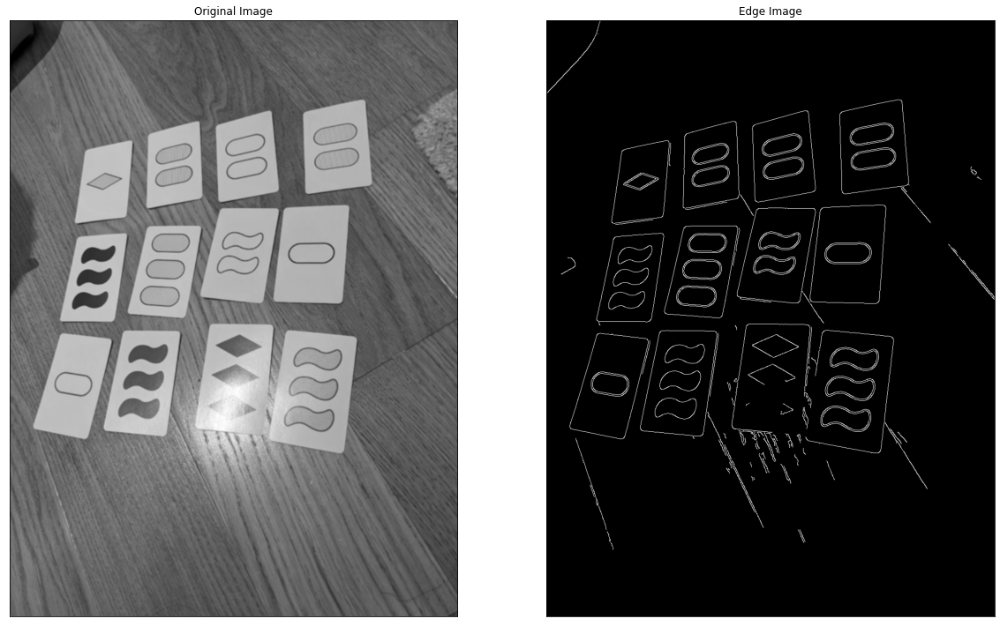

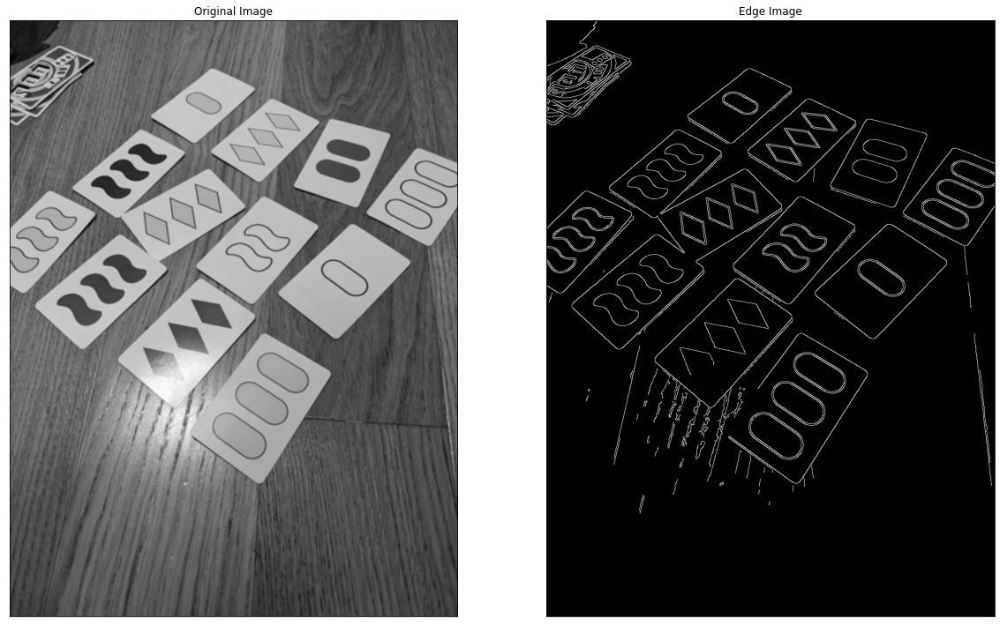

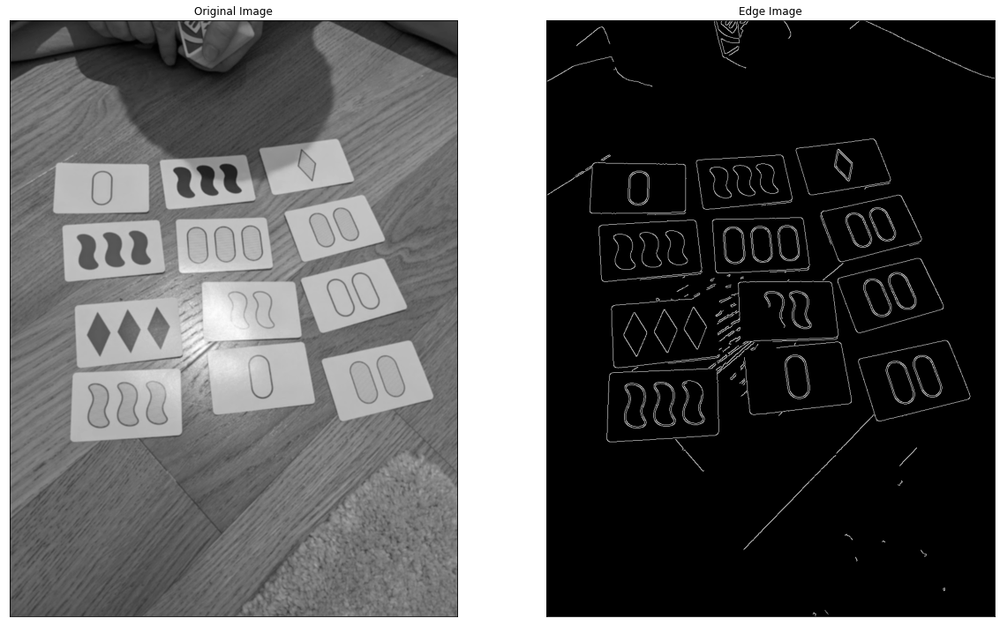

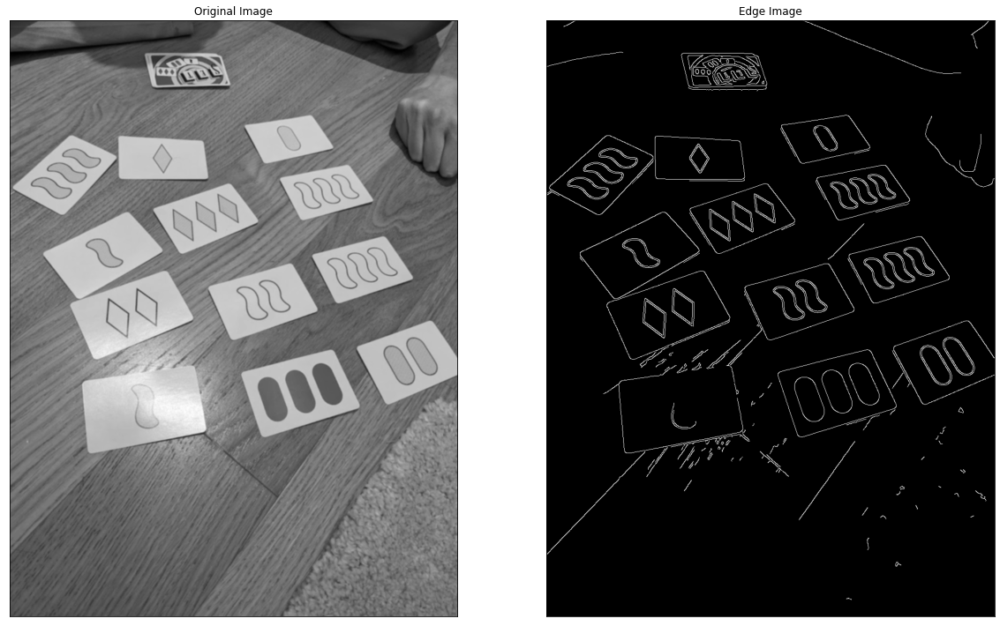

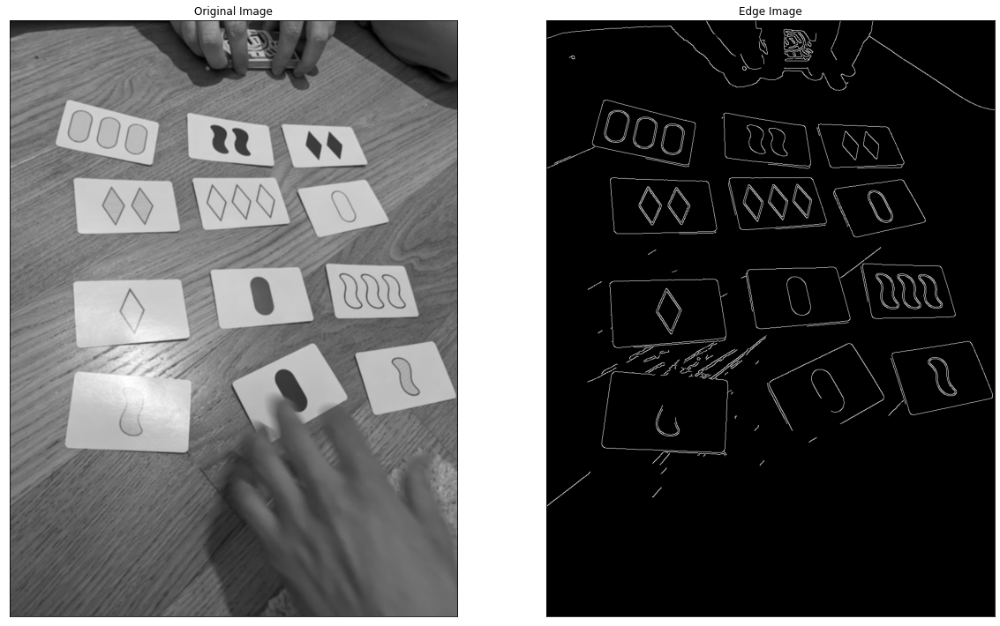

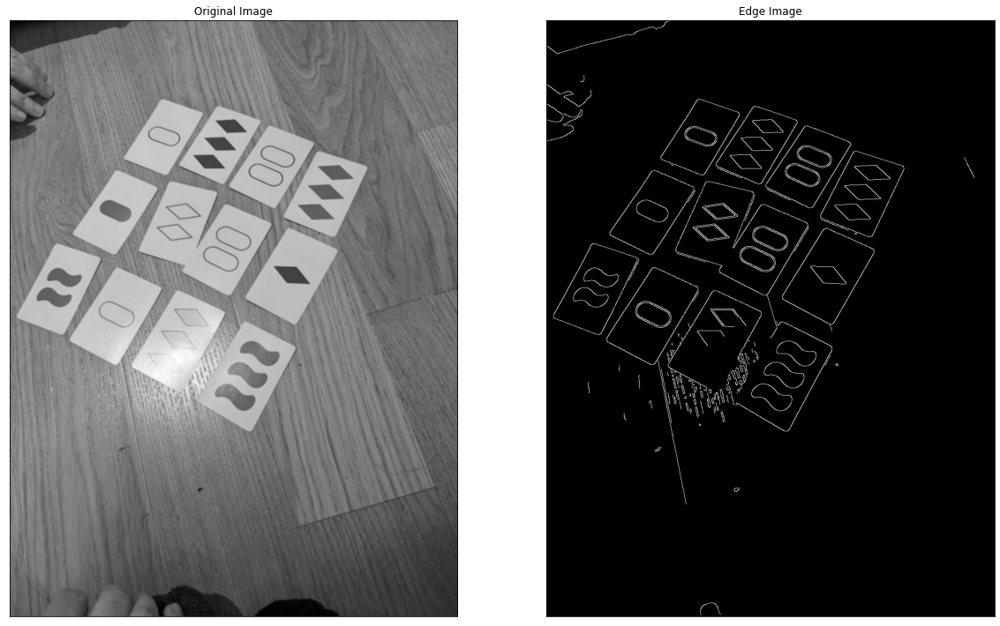

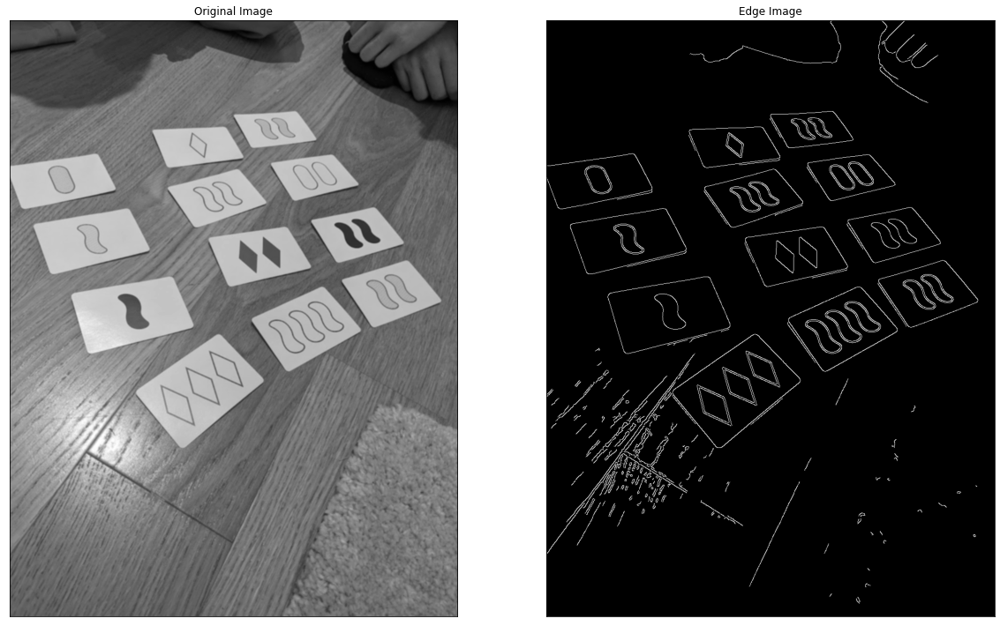

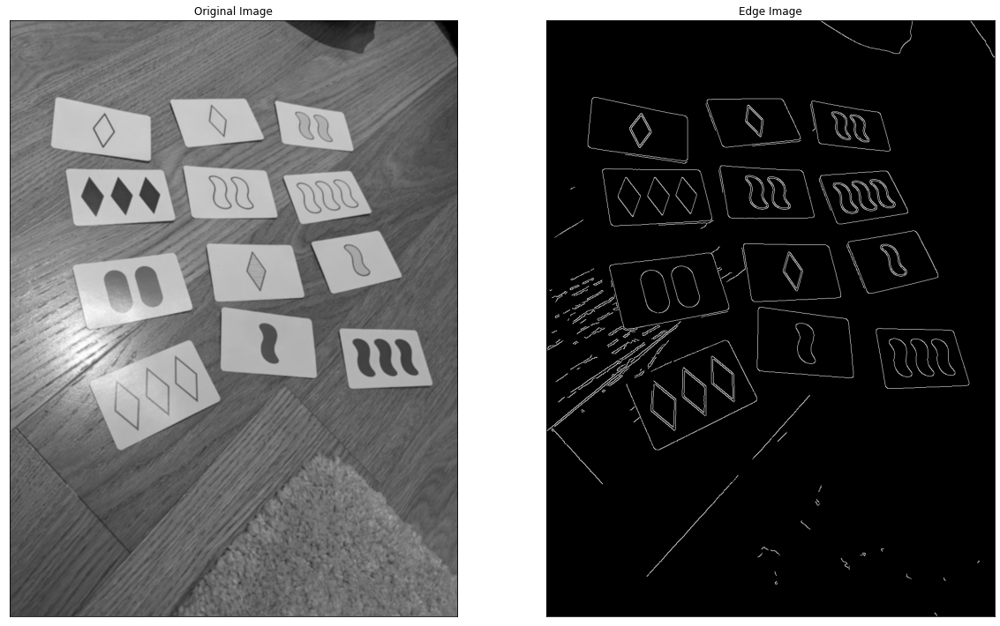

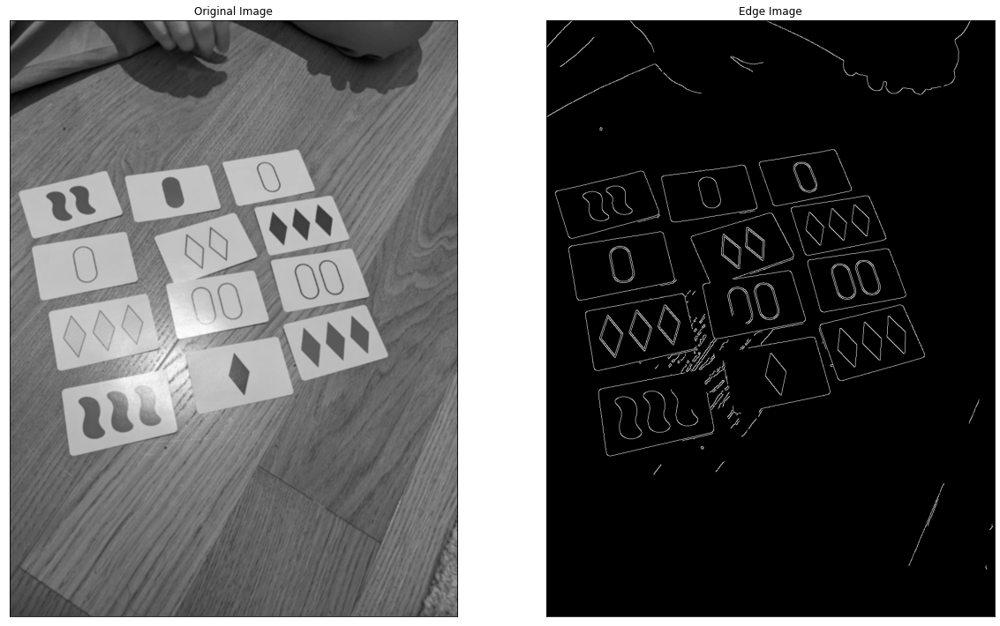

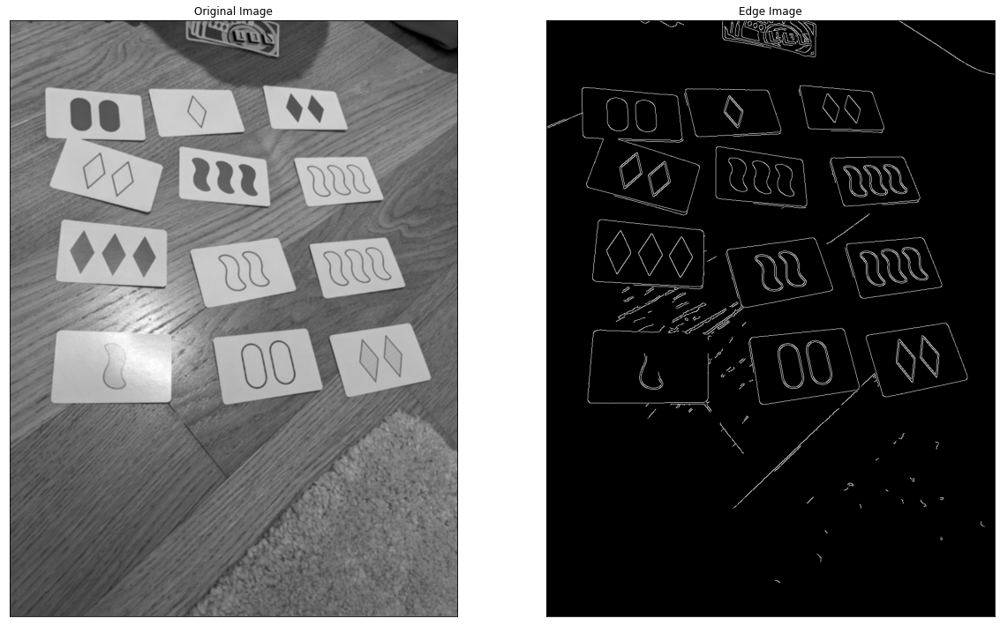

In [246]:
PATH = "data/train/PXL_20220223_020637682.MP.jpg"
def plot_edges(path):
    img = cv2.imread(path,0)
    img = cv2.GaussianBlur(img, (5,5),0)
    edges = cv2.Canny(img,100,200, 10)
    fig, ax = plt.subplots(1, 2, figsize=(20,20))
    ax[0].imshow(img,cmap = 'gray')
    ax[0].set_title('Original Image')
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[1].imshow(edges,cmap = 'gray')
    ax[1].set_title('Edge Image')
    ax[1].set_xticks([])
    ax[1].set_yticks([])

def get_train_paths():
    for file in os.listdir('data/train'):
        if not file.endswith('jpg'):
            continue
        yield os.path.join('data/train', file)

for path in get_train_paths():
    plot_edges(path)

(1230, 922)
(1230, 922)
(1230, 922)
(1230, 922)
(1230, 922)
(1303, 977)
(1230, 922)
(1230, 922)
(1230, 922)
(1230, 922)


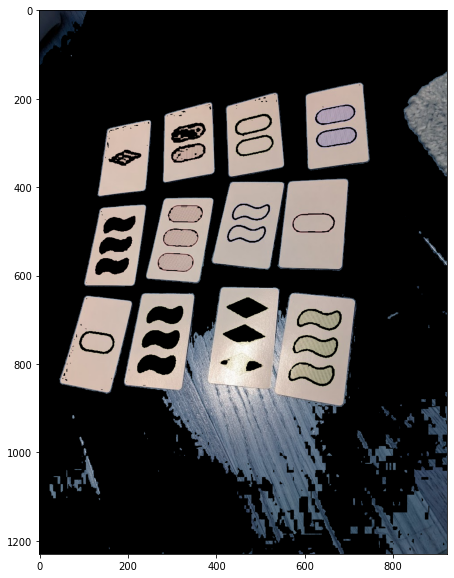

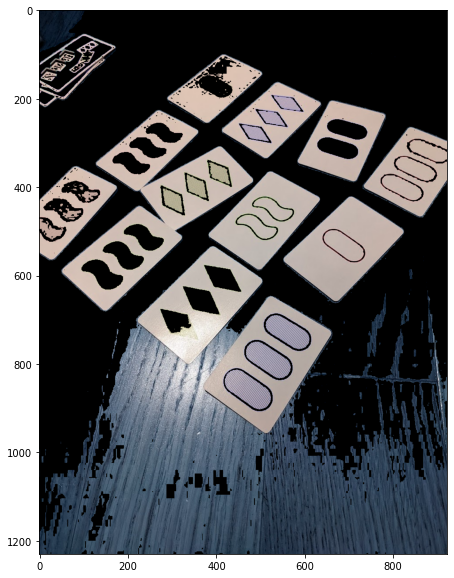

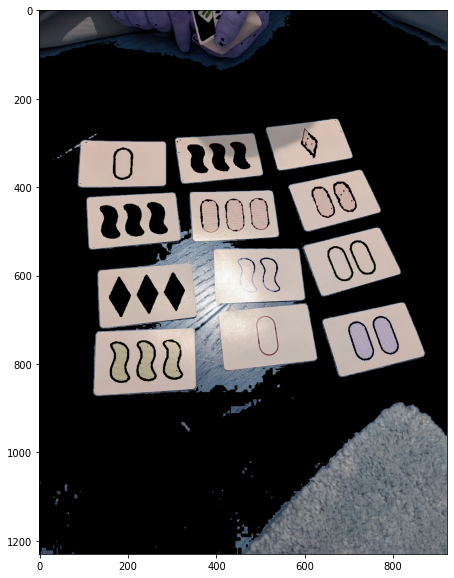

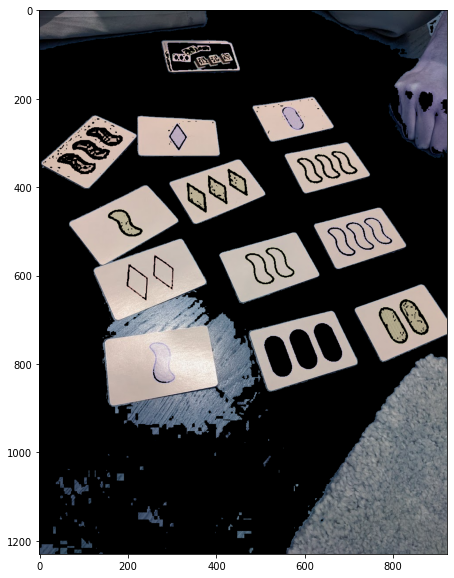

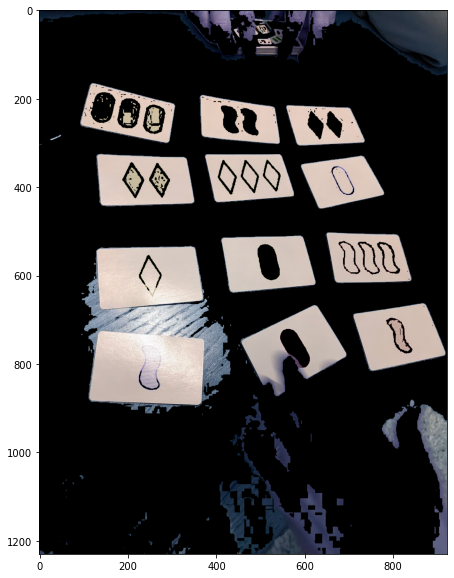

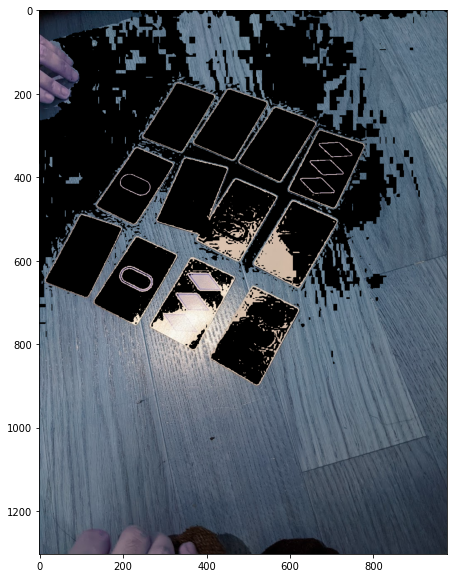

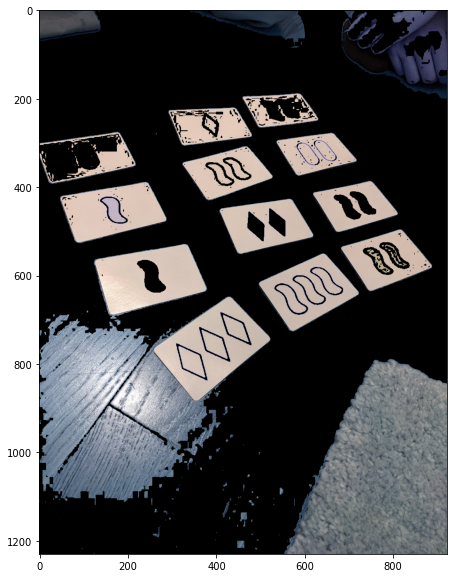

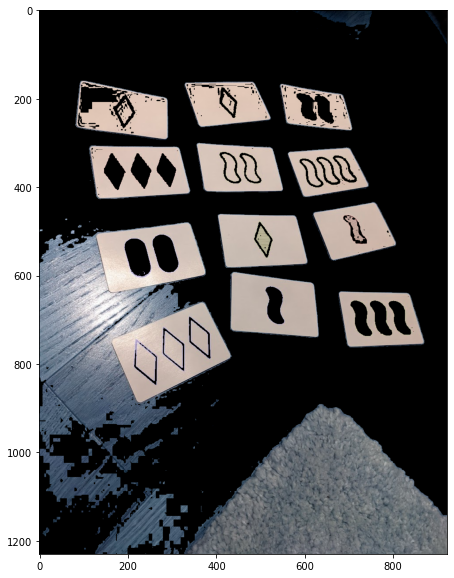

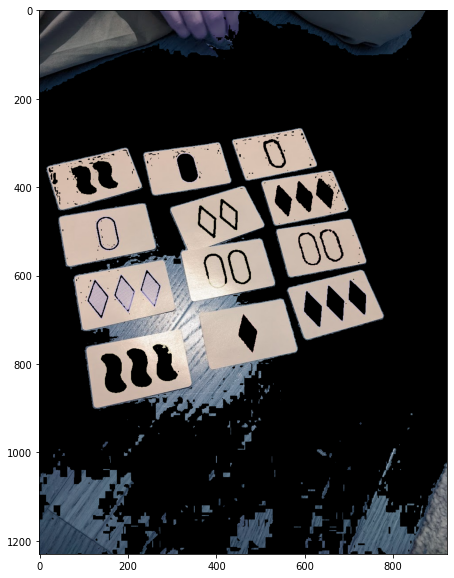

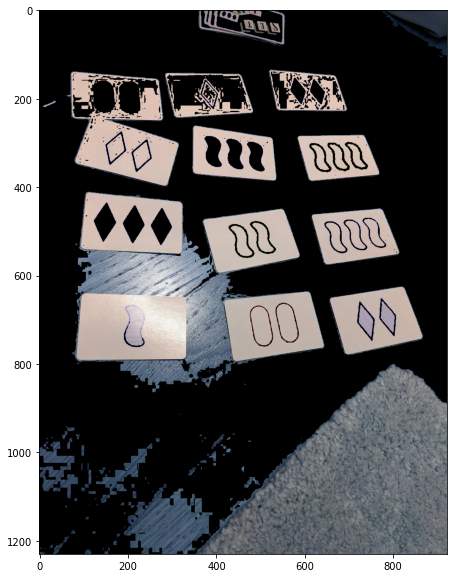

In [245]:
def plot_hist(path):
    color = ('b','g','r')
    img = cv2.imread(path)
    grayness = np.std(img, -1)
    mask = grayness < 18
    # img = cv2.applyColorMap(grayness, cv2.COLORMAP_PINK)
    plt.figure(figsize=(10,10))
    print(mask.shape)
    plt.imshow(mask[:,:,np.newaxis]*img)
    # cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    # plt.hist(img.reshape(-1))
    # for i,col in enumerate(color):
    #     histr = cv.calcHist([img],[i],None,[256],[0,256])
    #     plt.plot(histr,color = col)
    # img = cv.co
    # plt.xlim([0,256])

for path in get_train_paths():
    plot_hist(path)
    # break

data/train/PXL_20220223_015252441.MP.jpg
data/train/PXL_20220223_015447292.MP.jpg
data/train/PXL_20220223_015255432.MP.jpg
data/train/PXL_20220223_015737555.MP.jpg
data/train/PXL_20220223_020111303.MP.jpg
data/train/PXL_20220223_014825675.MP.jpg
data/train/PXL_20220223_020637682.MP.jpg
data/train/PXL_20220223_020823192.MP.jpg
data/train/PXL_20220223_014829400.MP.jpg
data/train/PXL_20220223_015905189.MP.jpg


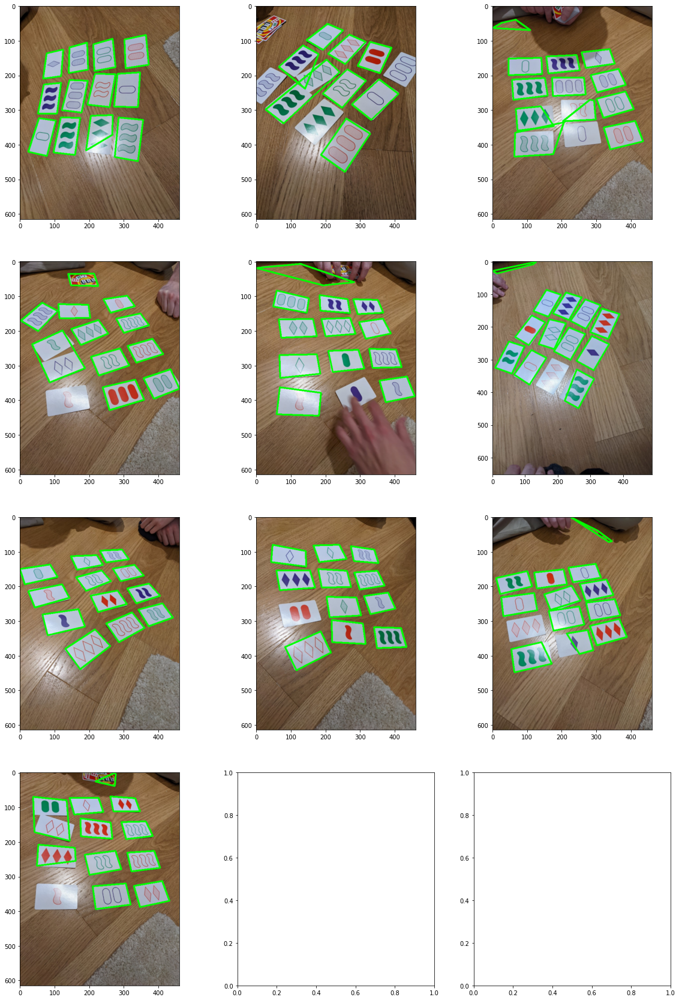

In [256]:
import cv2
import math


def clahe(bgr):
    lab = cv2.cvtColor(bgr, cv2.COLOR_BGR2LAB)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    lab[..., 0] = clahe.apply(lab[..., 0])
    bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
    return bgr

def show(images):
    nrows = math.ceil(math.sqrt(len(images)))
    ncols = math.floor(math.sqrt(len(images)))
    fig, ax = plt.subplots(nrows, ncols, figsize=(20, 30))
    for i, (image, ax) in enumerate(zip(images, fig.axes)):
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        ax.imshow(image)

def find_rectangles(path):

    orig_image = cv2.imread(path)
    orig_image = cv2.pyrDown(orig_image)
    
    # Downsample to remove noise
    image = cv2.pyrDown(orig_image)
    image = cv2.pyrUp(image)


    # blur = cv2.pyrMeanShiftFiltering(image, 11, 21)
    image0 = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # image = cv2.resize(image, (512, 512))
    # show(image)
    # image = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
    # image0 = cv2.threshold(image0, 100, 255, cv2.THRESH_BINARY_INV)[1]
    # show(image)
    N = 11

    for l in range(N):
        if l == 0:
            image = cv2.Canny(image0, 100, 150, 20)
            # return image
            # TODO dilate
        else:
            image = cv2.threshold(
                image0, (l + 1) * 255 / N, 240, cv2.THRESH_BINARY_INV
            )[1]

        cnts = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = cnts[0] if len(cnts) == 2 else cnts[1]
        cnts = [c for c in cnts if len(c) >= 3]  # TODO tune this threshold
        # print(len(cnts))
        image = orig_image.copy()

        def approx(c):
            peri = cv2.arcLength(c, True)
            approx = cv2.approxPolyDP(c, 0.015 * peri, True)
            approx = cv2.convexHull(approx)
            approx = cv2.approxPolyDP(approx, 0.015 * peri, True)
            return approx

        def angle(pt1, pt2, pt0):
            """finds a cosine of angle between vectors
            from pt0->pt1 and from pt0->pt2
            """
            pt1, pt2, pt0 = pt1[0], pt2[0], pt0[0]
            dx1 = pt1[0] - pt0[0]
            dy1 = pt1[1] - pt0[1]
            dx2 = pt2[0] - pt0[0]
            dy2 = pt2[1] - pt0[1]
            return (dx1 * dx2 + dy1 * dy2) / math.sqrt(
                (dx1 * dx1 + dy1 * dy1) * (dx2 * dx2 + dy2 * dy2) + 1e-10
            )

        def compute_cosines(c):
            # Copy first two points so all angles are computed
            c = np.concatenate([c, c[:2]], 0)
            cosines = []
            for i in range(0, len(c) - 2):
                cosines.append(abs(angle(c[i], c[i + 2], c[i + 1])))
            cosines.sort()
            # Select 4 angles closest to 90 degrees
            cosines = [i for a, i in cosines[:4]]
            return cosines

        def is_good_contour(c):
            # Match exactly 4 points
            if len(c) != 4:
                return False
            # Apply size filter
            x, y, w, h = cv2.boundingRect(c)
            area = w * h
            if area < 80 * 25:  # TODO: tune
                return False
            return True

        cnts = [approx(c) for c in cnts]
        cnts = [c for c in cnts if is_good_contour(c)]

        # cnts = cnts[1:3]

        def extract_card(c):
            rectangle = np.array([[0, 0], [0, 122], [200, 112], [200, 0]])
            # print(c)
            # for point in c[:,0,:]:
            # cv2.circle(image, point, 10, (255, 0, 0), -1)
            # Orient rectangle
            def dist(p1, p2):
                return np.abs(p1 - p2).sum()

            if dist(c[0], c[1]) > dist(c[1], c[2]):
                c = np.concatenate([c[1:], c[:1]])

            try:
                homog = cv2.findHomography(c, rectangle, cv2.RANSAC)
                extract = cv2.warpPerspective(image, homog[0], (200, 122))
                show(cv2.pyrDown(extract))
            except Exception as e:
                print(e)
                pass

        # for c in cnts:
            # extract_card(c)

        cv2.drawContours(image, cnts, -1, (0, 255, 0), 3)
        # show(image)
        return image

        break

    # cv2.imshow('thresh', thresh)
    # cv2.imshow('image', image)
    # cv2.waitKey()

images = []
for path in get_train_paths():
    print(path)
    images.append(find_rectangles(path))
    # break

show(images)


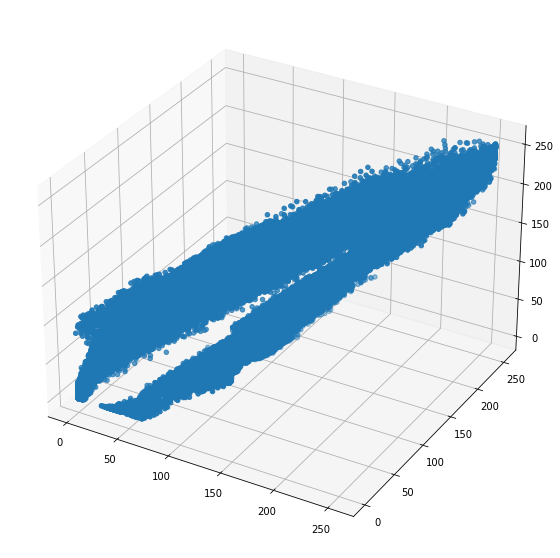

In [232]:
for path in get_train_paths():
    img = cv2.imread(path)
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(projection='3d')
    img = img.reshape(-1, 3).T
    ax.scatter(img[0], img[1], img[2])
    break

In [ ]:
import cv2
import numpy as np;

params = cv2.SimpleBlobDetector_Params()
params.blobColor = 255
params.maxArea = 5000*30
params.
# params.

ver = (cv2.__version__).split('.')
if int(ver[0]) < 3 :
    detector = cv2.SimpleBlobDetector(params)
else : 
    detector = cv2.SimpleBlobDetector_create(params)

im = cv2.imread("pictures/PXL_20220223_020637682.MP.jpg", cv2.IMREAD_GRAYSCALE)
# Detect blobs.
keypoints = detector.detect(im)
 
# Draw detected blobs as red circles.
# cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS ensures the size of the circle corresponds to the size of blob
im_with_keypoints = cv2.drawKeypoints(im, keypoints, np.array([]), (0,0,255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
fig, ax = plt.subplots(figsize=(18, 18))
ax.imshow(im_with_keypoints)
# plt.show()

In [ ]:
from __future__ import print_function
import cv2 as cv
import numpy as np
import argparse
parser = argparse.ArgumentParser(description='Code for Feature Matching with FLANN tutorial.')
parser.add_argument('--input1', help='Path to input image 1.', default='box.png')
parser.add_argument('--input2', help='Path to input image 2.', default='box_in_scene.png')
args = parser.parse_args()
img_object = cv.imread(cv.samples.findFile(args.input1), cv.IMREAD_GRAYSCALE)
img_scene = cv.imread(cv.samples.findFile(args.input2), cv.IMREAD_GRAYSCALE)
if img_object is None or img_scene is None:
    print('Could not open or find the images!')
    exit(0)
#-- Step 1: Detect the keypoints using SURF Detector, compute the descriptors
minHessian = 400
detector = cv.xfeatures2d_SURF.create(hessianThreshold=minHessian)
keypoints_obj, descriptors_obj = detector.detectAndCompute(img_object, None)
keypoints_scene, descriptors_scene = detector.detectAndCompute(img_scene, None)
#-- Step 2: Matching descriptor vectors with a FLANN based matcher
# Since SURF is a floating-point descriptor NORM_L2 is used
matcher = cv.DescriptorMatcher_create(cv.DescriptorMatcher_FLANNBASED)
knn_matches = matcher.knnMatch(descriptors_obj, descriptors_scene, 2)
#-- Filter matches using the Lowe's ratio test
ratio_thresh = 0.75
good_matches = []
for m,n in knn_matches:
    if m.distance < ratio_thresh * n.distance:
        good_matches.append(m)
#-- Draw matches
img_matches = np.empty((max(img_object.shape[0], img_scene.shape[0]), img_object.shape[1]+img_scene.shape[1], 3), dtype=np.uint8)
cv.drawMatches(img_object, keypoints_obj, img_scene, keypoints_scene, good_matches, img_matches, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
#-- Localize the object
obj = np.empty((len(good_matches),2), dtype=np.float32)
scene = np.empty((len(good_matches),2), dtype=np.float32)
for i in range(len(good_matches)):
    #-- Get the keypoints from the good matches
    obj[i,0] = keypoints_obj[good_matches[i].queryIdx].pt[0]
    obj[i,1] = keypoints_obj[good_matches[i].queryIdx].pt[1]
    scene[i,0] = keypoints_scene[good_matches[i].trainIdx].pt[0]
    scene[i,1] = keypoints_scene[good_matches[i].trainIdx].pt[1]
H, _ =  cv.findHomography(obj, scene, cv.RANSAC)
#-- Get the corners from the image_1 ( the object to be "detected" )
obj_corners = np.empty((4,1,2), dtype=np.float32)
obj_corners[0,0,0] = 0
obj_corners[0,0,1] = 0
obj_corners[1,0,0] = img_object.shape[1]
obj_corners[1,0,1] = 0
obj_corners[2,0,0] = img_object.shape[1]
obj_corners[2,0,1] = img_object.shape[0]
obj_corners[3,0,0] = 0
obj_corners[3,0,1] = img_object.shape[0]
scene_corners = cv.perspectiveTransform(obj_corners, H)
#-- Draw lines between the corners (the mapped object in the scene - image_2 )
cv.line(img_matches, (int(scene_corners[0,0,0] + img_object.shape[1]), int(scene_corners[0,0,1])),\
    (int(scene_corners[1,0,0] + img_object.shape[1]), int(scene_corners[1,0,1])), (0,255,0), 4)
cv.line(img_matches, (int(scene_corners[1,0,0] + img_object.shape[1]), int(scene_corners[1,0,1])),\
    (int(scene_corners[2,0,0] + img_object.shape[1]), int(scene_corners[2,0,1])), (0,255,0), 4)
cv.line(img_matches, (int(scene_corners[2,0,0] + img_object.shape[1]), int(scene_corners[2,0,1])),\
    (int(scene_corners[3,0,0] + img_object.shape[1]), int(scene_corners[3,0,1])), (0,255,0), 4)
cv.line(img_matches, (int(scene_corners[3,0,0] + img_object.shape[1]), int(scene_corners[3,0,1])),\
    (int(scene_corners[0,0,0] + img_object.shape[1]), int(scene_corners[0,0,1])), (0,255,0), 4)
#-- Show detected matches
cv.imshow('Good Matches & Object detection', img_matches)
cv.waitKey()


In [ ]:
from __future__ import print_function
import cv2 as cv
import numpy as np
import argparse
parser = argparse.ArgumentParser(description='Code for Feature Matching with FLANN tutorial.')
parser.add_argument('--input1', help='Path to input image 1.', default='box.png')
parser.add_argument('--input2', help='Path to input image 2.', default='box_in_scene.png')
args = parser.parse_args()
img_object = cv.imread(cv.samples.findFile(args.input1), cv.IMREAD_GRAYSCALE)
img_scene = cv.imread(cv.samples.findFile(args.input2), cv.IMREAD_GRAYSCALE)
if img_object is None or img_scene is None:
    print('Could not open or find the images!')
    exit(0)
#-- Step 1: Detect the keypoints using SURF Detector, compute the descriptors
minHessian = 400
detector = cv.xfeatures2d_SURF.create(hessianThreshold=minHessian)
keypoints_obj, descriptors_obj = detector.detectAndCompute(img_object, None)
keypoints_scene, descriptors_scene = detector.detectAndCompute(img_scene, None)
#-- Step 2: Matching descriptor vectors with a FLANN based matcher
# Since SURF is a floating-point descriptor NORM_L2 is used
matcher = cv.DescriptorMatcher_create(cv.DescriptorMatcher_FLANNBASED)
knn_matches = matcher.knnMatch(descriptors_obj, descriptors_scene, 2)
#-- Filter matches using the Lowe's ratio test
ratio_thresh = 0.75
good_matches = []
for m,n in knn_matches:
    if m.distance < ratio_thresh * n.distance:
        good_matches.append(m)
#-- Draw matches
img_matches = np.empty((max(img_object.shape[0], img_scene.shape[0]), img_object.shape[1]+img_scene.shape[1], 3), dtype=np.uint8)
cv.drawMatches(img_object, keypoints_obj, img_scene, keypoints_scene, good_matches, img_matches, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
#-- Localize the object
obj = np.empty((len(good_matches),2), dtype=np.float32)
scene = np.empty((len(good_matches),2), dtype=np.float32)
for i in range(len(good_matches)):
    #-- Get the keypoints from the good matches
    obj[i,0] = keypoints_obj[good_matches[i].queryIdx].pt[0]
    obj[i,1] = keypoints_obj[good_matches[i].queryIdx].pt[1]
    scene[i,0] = keypoints_scene[good_matches[i].trainIdx].pt[0]
    scene[i,1] = keypoints_scene[good_matches[i].trainIdx].pt[1]
H, _ =  cv.findHomography(obj, scene, cv.RANSAC)
#-- Get the corners from the image_1 ( the object to be "detected" )
obj_corners = np.empty((4,1,2), dtype=np.float32)
obj_corners[0,0,0] = 0
obj_corners[0,0,1] = 0
obj_corners[1,0,0] = img_object.shape[1]
obj_corners[1,0,1] = 0
obj_corners[2,0,0] = img_object.shape[1]
obj_corners[2,0,1] = img_object.shape[0]
obj_corners[3,0,0] = 0
obj_corners[3,0,1] = img_object.shape[0]
scene_corners = cv.perspectiveTransform(obj_corners, H)
#-- Draw lines between the corners (the mapped object in the scene - image_2 )
cv.line(img_matches, (int(scene_corners[0,0,0] + img_object.shape[1]), int(scene_corners[0,0,1])),\
    (int(scene_corners[1,0,0] + img_object.shape[1]), int(scene_corners[1,0,1])), (0,255,0), 4)
cv.line(img_matches, (int(scene_corners[1,0,0] + img_object.shape[1]), int(scene_corners[1,0,1])),\
    (int(scene_corners[2,0,0] + img_object.shape[1]), int(scene_corners[2,0,1])), (0,255,0), 4)
cv.line(img_matches, (int(scene_corners[2,0,0] + img_object.shape[1]), int(scene_corners[2,0,1])),\
    (int(scene_corners[3,0,0] + img_object.shape[1]), int(scene_corners[3,0,1])), (0,255,0), 4)
cv.line(img_matches, (int(scene_corners[3,0,0] + img_object.shape[1]), int(scene_corners[3,0,1])),\
    (int(scene_corners[0,0,0] + img_object.shape[1]), int(scene_corners[0,0,1])), (0,255,0), 4)